In [1]:
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import numpy as np
import gc
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("data/metadata.csv")

In [3]:
df

,card_file_name,id,link,name,rarity,setname,type
0,data/pictures/Base Set/Alakazam_(Base_Set_1),1/102,https://bulbapedia.bulbagarden.net/wiki/Alakaz...,Alakazam,Rare Holo,Base Set,Psychic
1,data/pictures/Base Set/Blastoise_(Base_Set_2),2/102,https://bulbapedia.bulbagarden.net/wiki/Blasto...,Blastoise,Rare Holo,Base Set,Water
2,data/pictures/Base Set/Chansey_(Base_Set_3),3/102,https://bulbapedia.bulbagarden.net/wiki/Chanse...,Chansey,Rare Holo,Base Set,Colorless
3,data/pictures/Base Set/Charizard_(Base_Set_4),4/102,https://bulbapedia.bulbagarden.net/wiki/Chariz...,Charizard,Rare Holo,Base Set,Fire
4,data/pictures/Base Set/Clefairy_(Base_Set_5),5/102,https://bulbapedia.bulbagarden.net/wiki/Clefai...,Clefairy,Rare Holo,Base Set,Colorless
...,...,...,...,...,...,...,...
9937,data/pictures/Pokémon Rumble/Lucario_(Pok%C3%A...,12/16,https://bulbapedia.bulbagarden.net/wiki/Lucari...,Lucario,Unknown rarity,Pokémon Rumble,Fighting
9938,data/pictures/Pokémon Rumble/Skuntank_(Pok%C3%...,13/16,https://bulbapedia.bulbagarden.net/wiki/Skunta...,Skuntank,Unknown rarity,Pokémon Rumble,Darkness
9939,data/pictures/Pokémon Rumble/Bastiodon_(Pok%C3...,14/16,https://bulbapedia.bulbagarden.net/wiki/Bastio...,Bastiodon,Unknown rarity,Pokémon Rumble,Metal
9940,data/pictures/Pokémon Rumble/Rattata_(Pok%C3%A...,15/16,https://bulbapedia.bulbagarden.net/wiki/Rattat...,Rattata,Unknown rarity,Pokémon Rumble,Colorless


# Drop a couple of bad records

In [4]:
df = df[~df["card_file_name"].isin([
    "data/pictures/Mysterious Treasures/Honchkrow_(Mysterious_Treasures_10)",
    "data/pictures/Unified Minds/Umbreon_%26_Darkrai-GX_(Unified_Minds_125)", # missing on website
    "data/pictures/Base Set/Charizard_(Base_Set_4)", # special version of normal website
    "data/pictures/Stormfront/Charizard_(Stormfront_103)", # special version of normal website
])]

filter to Pokemon types

In [5]:
# df.type.value_counts()
filter_to_pokemon_types = False

if filter_to_pokemon_types:
    df = df[df["type"].isin([
        "Water",
        "Grass",
        "Colorless",
        "Psychic",
        "Fighting",
        "Fire",
        "Lightning",
        "Darkness",
        "Metal",
        "Dragon",
        "Fairy",
    ])]

# Create dataset

In [6]:
n_records = df.shape[0]
downsample_rate = .30

# Function to load and preprocess each image
def parse_image_file(filename, downsample_rate=downsample_rate):
    img = tf.io.read_file(filename)
    img = tf.cast(tf.image.decode_jpeg(img, channels=3), tf.float32) / 255.0
    
#     if img.shape[0] < 50:
#         print(f"Error with image `{filename}`: shape found was small: {img.shape}")
    img = tf.image.resize_with_crop_or_pad(img, 260, 180)
    
    # Some images have an extra alpha channel. Remove that.
    img = img[:, :, :3]
    
    x = tf.image.resize(img, size = (int(img.shape[0] * downsample_rate), int(img.shape[1] * downsample_rate)))
    
    return x, img

In [7]:
x = tf.constant(df["card_file_name"].values)

all_data = tf.data.Dataset.from_tensor_slices(
    (x,)
).map(parse_image_file).shuffle(10000)

In [8]:
input_shape = tuple(all_data.element_spec[0].shape)
output_shape = tuple(all_data.element_spec[1].shape)

print(f"Converting from {input_shape} to {output_shape}")

Converting from (78, 54, 3) to (260, 180, 3)


# Split dataset

In [9]:
train_frac = .7
batch_size = 100

train = all_data.take(int(train_frac * n_records)).batch(batch_size)
remaining_data = all_data.skip(int(train_frac * n_records))

validate = remaining_data.take(int(.5 * (1 - train_frac) * n_records)).batch(batch_size)
test = remaining_data.skip(int(.5 * (1 - train_frac) * n_records)).batch(batch_size)

# Model

In [10]:
def calc_sampling_sizes(
    init_width: int,
    init_height: int,
    stride: int,
    kernel_sizes: list,
    stride_skip_indices: list = None
):
    if stride_skip_indices is None:
        stride_skip_indices = []
        
    def print_wh(w, h):
        print(f"{w}:{h}")
        
    for i, kernel_size in enumerate(kernel_sizes):
        print_wh(init_width, init_height)
        c_stride = stride * (2 if i not in stride_skip_indices else 1)
        
        init_width = (init_width - (kernel_size - 1)) / c_stride
        init_height = (init_height - (kernel_size - 1)) / c_stride
        
    assert int(init_height) == init_height and int(init_width) == init_width
    print_wh(init_width, init_height)
    
    return int(init_width), int(init_height)

In [11]:
downsampling_steps = [3]
downsampling_stride = 2
downsampling_filters = 10

upsampling_steps = [9, 5, 5, 1]
upsampling_filters = 10
upsampling_init_filters = 5

dense_layers = [300, 300]
use_flatten = len(dense_layers) > 0

In [12]:
upsampling_input_shape = calc_sampling_sizes(
    output_shape[0], 
    output_shape[1],
    1,
    reversed(upsampling_steps),
    stride_skip_indices=[0]
)

upsampling_input_shape = tuple([*upsampling_input_shape, upsampling_init_filters])
print(upsampling_input_shape)

260:180
260.0:180.0
128.0:88.0
62.0:42.0
27.0:17.0
(27, 17, 5)


In [13]:
downsampling_output_shape = calc_sampling_sizes(
    input_shape[0], 
    input_shape[1],
    downsampling_stride,
    downsampling_steps,
    stride_skip_indices=[],
)

downsampling_output_shape = tuple([*downsampling_output_shape, downsampling_filters])
print(downsampling_output_shape)

78:54
19.0:13.0
(19, 13, 10)


In [14]:
if not use_flatten:
    assert upsampling_input_shape[0] >= downsampling_output_shape[0] and \
        upsampling_input_shape[1] >= downsampling_output_shape[1], \
        f"{upsampling_input_shape} vs {downsampling_output_shape}"

In [16]:
def modify_padding(padding):
    new_padding = int(padding / 2)
    if padding % 2 == 0:
        return (new_padding, new_padding)
    else:
        return (new_padding, new_padding + 1)
    

In [19]:
model = keras.Sequential()
model.add(keras.layers.Input(input_shape))

for down_step in downsampling_steps:
    model.add(keras.layers.Conv2D(
        filters=downsampling_filters, 
        kernel_size=down_step, 
        strides=downsampling_stride, 
        activation="relu",
    ))
    model.add(keras.layers.MaxPool2D())

if use_flatten:
    model.add(keras.layers.Flatten())

    for dense_size in dense_layers:
        model.add(keras.layers.Dense(units=dense_size, activation="relu"))

    model.add(keras.layers.Dense(units=int(tf.reduce_prod(upsampling_input_shape)), activation="relu"))
    model.add(keras.layers.Reshape(upsampling_input_shape))
else:
    pad_width = modify_padding(upsampling_input_shape[0] - downsampling_output_shape[0])
    pad_height = modify_padding(upsampling_input_shape[1] - downsampling_output_shape[1])
    
    model.add(keras.layers.ZeroPadding2D((pad_width, pad_height)))


for i, up_step in enumerate(upsampling_steps):
    last_step = i == len(upsampling_steps) - 1
    act = "sigmoid" if last_step else "relu"
    filters = 3 if last_step else upsampling_filters
    
    if not last_step:
        model.add(keras.layers.UpSampling2D(2))
                
    model.add(keras.layers.Conv2DTranspose(
        filters=filters, 
        kernel_size=up_step, 
        strides=1,
        activation=act,
    ))
    

In [20]:
model.compile(
    optimizer=keras.optimizers.Nadam(learning_rate=.001),
    loss=keras.losses.MSE,
    metrics=[keras.metrics.MAE]
)

model.summary()
assert model.output_shape[1:] == output_shape, f"Expected: {output_shape}, got: {model.output_shape[1:]}"

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 38, 26, 10)        280       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 19, 13, 10)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 2470)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 300)               741300    
_________________________________________________________________
dense_7 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_8 (Dense)              (None, 2295)              690795    
_________________________________________________________________
reshape_2 (Reshape)          (None, 27, 17, 5)        

In [ ]:
gc.collect()
try:
    model.fit(train, validation_data=validate, epochs=22, shuffle=True)
finally:
    gc.collect()

Train for 70 steps, validate for 15 steps
Epoch 1/22
69/70 [============================>.] - ETA: 3s - loss: 0.0741 - mean_absolute_error: 0.2282

In [146]:
gc.collect()

20

# Test a couple of records

In [27]:
def plot_and_predict(x, y):
    assert x.shape[0] == 1, "Please only provide a single image at a time"
    
    prediction = model.predict(x)        
    fig=plt.figure(figsize=(10, 15))
    
    image_dict = {"downscaled": x, "real": y, "predicted": prediction}
    
    for i, (name, img) in enumerate(image_dict.items()):
        fig.add_subplot(1, 3, i+1)
        plt.imshow(tf.squeeze(img))
        plt.title(name)
    plt.show()
    

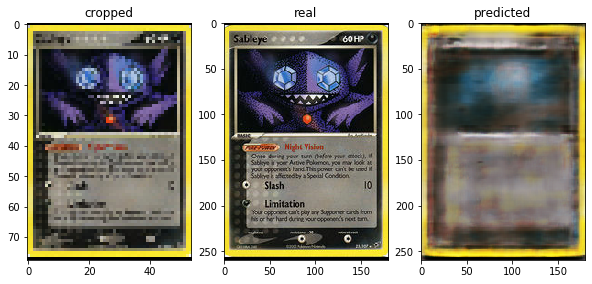

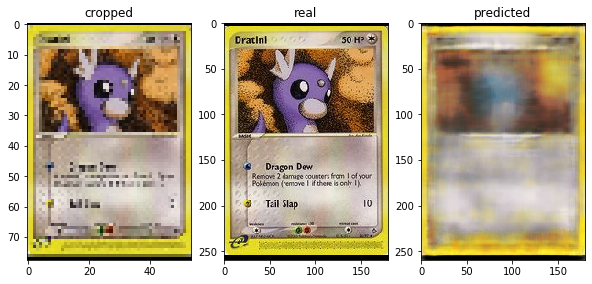

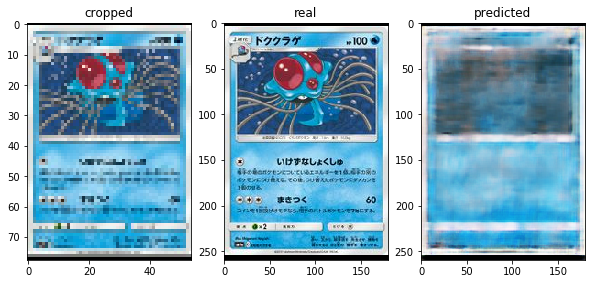

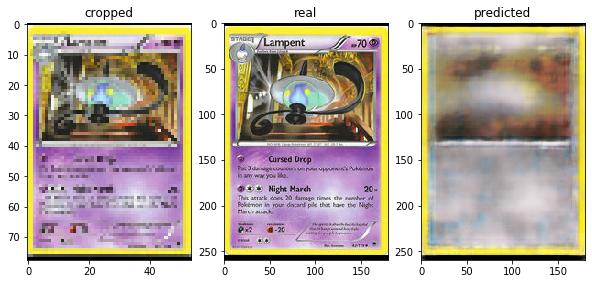

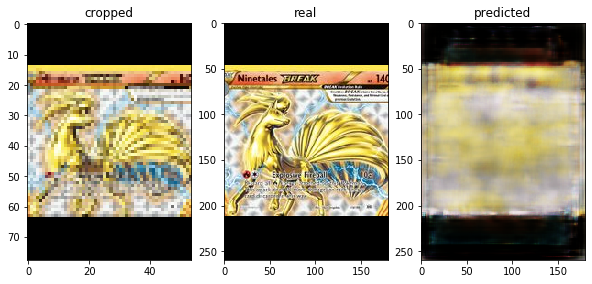

...

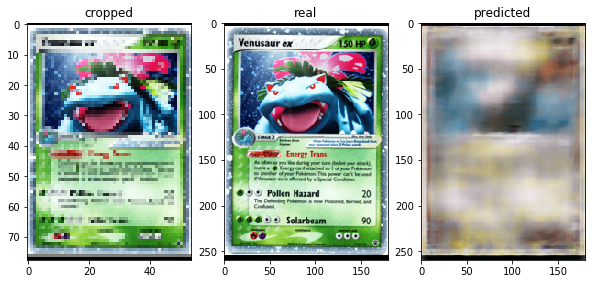

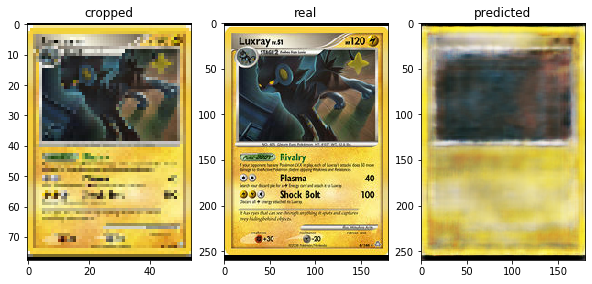

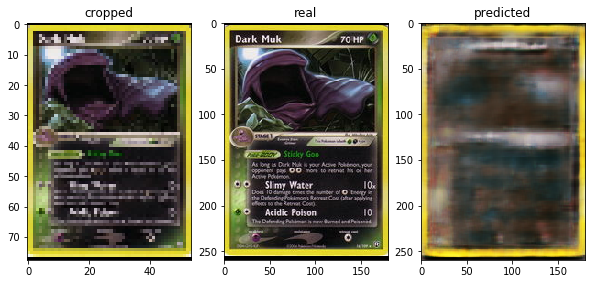

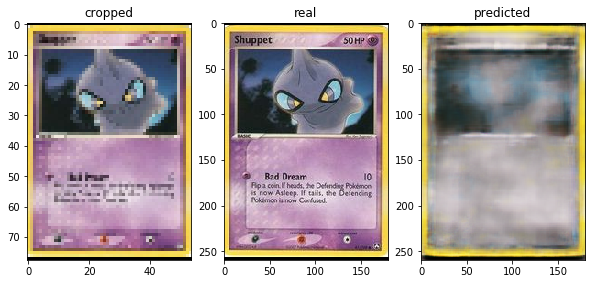

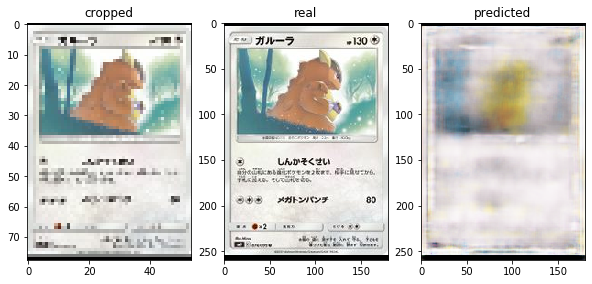

6473

In [29]:
for vis_x, vis_y in train.take(1):
    for i in range(vis_x.shape[0]):
        plot_and_predict(vis_x[i:i+1], vis_y[i:i+1])
        plt.show()
gc.collect()